# LOAN CREDIT RISK ASSESSMENT - ANALYSIS PART 1

In [1]:
pip install pandas numpy matplotlib seaborn


Note: you may need to restart the kernel to use updated packages.


In [2]:
#importing the necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
# Load the dataset - application_data.csv
app_data = pd.read_csv(r'C:\Users\sweth\OneDrive\Documents\Projects\OESON\Python\application_data.csv')
app_data

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307506,456251,0,Cash loans,M,N,N,0,157500.0,254700.0,27558.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
307507,456252,0,Cash loans,F,N,Y,0,72000.0,269550.0,12001.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
307508,456253,0,Cash loans,F,N,Y,0,153000.0,677664.0,29979.0,...,0,0,0,0,1.0,0.0,0.0,1.0,0.0,1.0
307509,456254,1,Cash loans,F,N,Y,0,171000.0,370107.0,20205.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [4]:
# To display basic information about the dataset
pd.set_option('display.max_info_columns', 200) 
app_data.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 122 columns):
 #    Column                        Non-Null Count   Dtype  
---   ------                        --------------   -----  
 0    SK_ID_CURR                    307511 non-null  int64  
 1    TARGET                        307511 non-null  int64  
 2    NAME_CONTRACT_TYPE            307511 non-null  object 
 3    CODE_GENDER                   307511 non-null  object 
 4    FLAG_OWN_CAR                  307511 non-null  object 
 5    FLAG_OWN_REALTY               307511 non-null  object 
 6    CNT_CHILDREN                  307511 non-null  int64  
 7    AMT_INCOME_TOTAL              307511 non-null  float64
 8    AMT_CREDIT                    307511 non-null  float64
 9    AMT_ANNUITY                   307499 non-null  float64
 10   AMT_GOODS_PRICE               307233 non-null  float64
 11   NAME_TYPE_SUITE               306219 non-null  object 
 12   NAME_INCOME_TYPE            

In [5]:
# To preview the first few rows of the dataset
app_data.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [6]:
# To check the shape of the dataset (number of rows and columns)
print("Shape of the dataset:", app_data.shape)

Shape of the dataset: (307511, 122)


In [7]:
# To get summary statistics for numerical columns
app_data.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000000,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,307511.000000,307511.000000,307511.000000,...,307511.000000,307511.000000,307511.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
mean,278180.518577,0.080729,0.417052,1.687979e+05,5.990260e+05,27108.573909,5.383962e+05,0.020868,-16036.995067,63815.045904,...,0.008130,0.000595,0.000507,0.000335,0.006402,0.007000,0.034362,0.267395,0.265474,1.899974
std,102790.175348,0.272419,0.722121,2.371231e+05,4.024908e+05,14493.737315,3.694465e+05,0.013831,4363.988632,141275.766519,...,0.089798,0.024387,0.022518,0.018299,0.083849,0.110757,0.204685,0.916002,0.794056,1.869295
min,100002.000000,0.000000,0.000000,2.565000e+04,4.500000e+04,1615.500000,4.050000e+04,0.000290,-25229.000000,-17912.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,189145.500000,0.000000,0.000000,1.125000e+05,2.700000e+05,16524.000000,2.385000e+05,0.010006,-19682.000000,-2760.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,278202.000000,0.000000,0.000000,1.471500e+05,5.135310e+05,24903.000000,4.500000e+05,0.018850,-15750.000000,-1213.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,367142.500000,0.000000,1.000000,2.025000e+05,8.086500e+05,34596.000000,6.795000e+05,0.028663,-12413.000000,-289.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,456255.000000,1.000000,19.000000,1.170000e+08,4.050000e+06,258025.500000,4.050000e+06,0.072508,-7489.000000,365243.000000,...,1.000000,1.000000,1.000000,1.000000,4.000000,9.000000,8.000000,27.000000,261.000000,25.000000


## Data Cleaning for application_data

In [8]:
# To check for missing values in each column
pd.set_option('display.max_rows', None)
missing_values_app = app_data.isnull().sum()
missing_values_app

SK_ID_CURR                           0
TARGET                               0
NAME_CONTRACT_TYPE                   0
CODE_GENDER                          0
FLAG_OWN_CAR                         0
FLAG_OWN_REALTY                      0
CNT_CHILDREN                         0
AMT_INCOME_TOTAL                     0
AMT_CREDIT                           0
AMT_ANNUITY                         12
AMT_GOODS_PRICE                    278
NAME_TYPE_SUITE                   1292
NAME_INCOME_TYPE                     0
NAME_EDUCATION_TYPE                  0
NAME_FAMILY_STATUS                   0
NAME_HOUSING_TYPE                    0
REGION_POPULATION_RELATIVE           0
DAYS_BIRTH                           0
DAYS_EMPLOYED                        0
DAYS_REGISTRATION                    0
DAYS_ID_PUBLISH                      0
OWN_CAR_AGE                     202929
FLAG_MOBIL                           0
FLAG_EMP_PHONE                       0
FLAG_WORK_PHONE                      0
FLAG_CONT_MOBILE         

In [9]:
# To calculate percentage of missing values for each column
missing_values_app_percentage = (missing_values_app / len(app_data))*100 
missing_values_app_percentage

SK_ID_CURR                       0.000000
TARGET                           0.000000
NAME_CONTRACT_TYPE               0.000000
CODE_GENDER                      0.000000
FLAG_OWN_CAR                     0.000000
FLAG_OWN_REALTY                  0.000000
CNT_CHILDREN                     0.000000
AMT_INCOME_TOTAL                 0.000000
AMT_CREDIT                       0.000000
AMT_ANNUITY                      0.003902
AMT_GOODS_PRICE                  0.090403
NAME_TYPE_SUITE                  0.420148
NAME_INCOME_TYPE                 0.000000
NAME_EDUCATION_TYPE              0.000000
NAME_FAMILY_STATUS               0.000000
NAME_HOUSING_TYPE                0.000000
REGION_POPULATION_RELATIVE       0.000000
DAYS_BIRTH                       0.000000
DAYS_EMPLOYED                    0.000000
DAYS_REGISTRATION                0.000000
DAYS_ID_PUBLISH                  0.000000
OWN_CAR_AGE                     65.990810
FLAG_MOBIL                       0.000000
FLAG_EMP_PHONE                   0

In [10]:
# Identify columns where the missing percentage is greater than 50%
columns_to_drop = missing_values_app_percentage[missing_values_app_percentage > 50].index
columns_to_drop

Index(['OWN_CAR_AGE', 'EXT_SOURCE_1', 'APARTMENTS_AVG', 'BASEMENTAREA_AVG',
       'YEARS_BUILD_AVG', 'COMMONAREA_AVG', 'ELEVATORS_AVG', 'ENTRANCES_AVG',
       'FLOORSMIN_AVG', 'LANDAREA_AVG', 'LIVINGAPARTMENTS_AVG',
       'LIVINGAREA_AVG', 'NONLIVINGAPARTMENTS_AVG', 'NONLIVINGAREA_AVG',
       'APARTMENTS_MODE', 'BASEMENTAREA_MODE', 'YEARS_BUILD_MODE',
       'COMMONAREA_MODE', 'ELEVATORS_MODE', 'ENTRANCES_MODE', 'FLOORSMIN_MODE',
       'LANDAREA_MODE', 'LIVINGAPARTMENTS_MODE', 'LIVINGAREA_MODE',
       'NONLIVINGAPARTMENTS_MODE', 'NONLIVINGAREA_MODE', 'APARTMENTS_MEDI',
       'BASEMENTAREA_MEDI', 'YEARS_BUILD_MEDI', 'COMMONAREA_MEDI',
       'ELEVATORS_MEDI', 'ENTRANCES_MEDI', 'FLOORSMIN_MEDI', 'LANDAREA_MEDI',
       'LIVINGAPARTMENTS_MEDI', 'LIVINGAREA_MEDI', 'NONLIVINGAPARTMENTS_MEDI',
       'NONLIVINGAREA_MEDI', 'FONDKAPREMONT_MODE', 'HOUSETYPE_MODE',
       'WALLSMATERIAL_MODE'],
      dtype='object')

##### Since there are relevant columns which has missing_values_app_percentage > 50, we can impute values for these relevant columns and drop the remaining irrelevant columns.

In [11]:
# To drop irrelevant columns which has missing_values_app_percentage > 50
columns_to_drop2 = ['OWN_CAR_AGE', 'NONLIVINGAPARTMENTS_AVG', 'NONLIVINGAREA_MODE' ,'NONLIVINGAPARTMENTS_MEDI', 'NONLIVINGAREA_MEDI',
'APARTMENTS_MODE', 'BASEMENTAREA_MODE', 'COMMONAREA_MODE', 'ELEVATORS_MODE', 'ENTRANCES_MODE', 'FLOORSMIN_MODE', 'LANDAREA_MODE',
'LIVINGAPARTMENTS_MODE','LIVINGAREA_MODE', 'WALLSMATERIAL_MODE', 'FLOORSMIN_AVG', 'FLOORSMIN_MEDI', 'YEARS_BUILD_MODE', 
'YEARS_BUILD_MEDI', 'APARTMENTS_MEDI', 'BASEMENTAREA_MEDI', 'COMMONAREA_MEDI', 'ELEVATORS_MEDI', 'ENTRANCES_MEDI', 'FLOORSMIN_MEDI', 
'LANDAREA_MEDI', 'LIVINGAPARTMENTS_MEDI', 'LIVINGAREA_MEDI']

In [12]:
app_data = app_data.drop(columns=columns_to_drop2, errors='ignore')

In [13]:
# To impute relevant columns 
columns_to_impute = [
    'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'APARTMENTS_AVG', 'BASEMENTAREA_AVG', 'COMMONAREA_AVG', 
    'NONLIVINGAREA_AVG', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'CNT_FAM_MEMBERS'                
]

In [14]:
# Impute with median for continuous variables
for col in columns_to_impute:
    app_data[col].fillna(app_data[col].median(), inplace= True)

C:\Users\sweth\AppData\Local\Temp\ipykernel_42308\2729719890.py:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  app_data[col].fillna(app_data[col].median(), inplace= True)
C:\Users\sweth\AppData\Local\Temp\ipykernel_42308\2729719890.py:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a cop

In [15]:
# For categorical columns, using mode 
app_data['FONDKAPREMONT_MODE'].fillna(app_data['FONDKAPREMONT_MODE'].mode()[0], inplace=True)
app_data['HOUSETYPE_MODE'].fillna(app_data['HOUSETYPE_MODE'].mode()[0], inplace=True)
app_data['NAME_TYPE_SUITE'].fillna(app_data['NAME_TYPE_SUITE'].mode()[0], inplace=True)
app_data['OCCUPATION_TYPE'].fillna(app_data['OCCUPATION_TYPE'].mode()[0], inplace=True)

C:\Users\sweth\AppData\Local\Temp\ipykernel_42308\1244316976.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  app_data['FONDKAPREMONT_MODE'].fillna(app_data['FONDKAPREMONT_MODE'].mode()[0], inplace=True)
C:\Users\sweth\AppData\Local\Temp\ipykernel_42308\1244316976.py:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are sett

In [16]:
# To drop unecessary columns
columns_to_drop3 = ['YEARS_BEGINEXPLUATATION_AVG', 'FLOORSMAX_AVG', 'LIVINGAPARTMENTS_AVG', 'YEARS_BEGINEXPLUATATION_MODE',
                    'FLOORSMAX_MODE', 'NONLIVINGAPARTMENTS_MODE', 'YEARS_BEGINEXPLUATATION_MEDI', 'FLOORSMAX_MEDI', 'TOTALAREA_MODE',          
                    'EMERGENCYSTATE_MODE', 'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCLE',
                    'DEF_60_CNT_SOCIAL_CIRCLE', 'DAYS_LAST_PHONE_CHANGE', 'YEARS_BEGINEXPLUATATION_AVG', 'AMT_REQ_CREDIT_BUREAU_HOUR',
                    'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK', 'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT',
                    'AMT_REQ_CREDIT_BUREAU_YEAR', 'YEARS_BUILD_AVG', 'ELEVATORS_AVG', 'ENTRANCES_AVG', 'LANDAREA_AVG', 'LIVINGAREA_AVG', 'FLAG_DOCUMENT_2', 
                    'FLAG_DOCUMENT_3','FLAG_DOCUMENT_4','FLAG_DOCUMENT_5', 'FLAG_DOCUMENT_6', 'FLAG_DOCUMENT_7', 'FLAG_DOCUMENT_8', 'FLAG_DOCUMENT_9', 'FLAG_DOCUMENT_10', 
                    'FLAG_DOCUMENT_11', 'FLAG_DOCUMENT_12', 'FLAG_DOCUMENT_13', 'FLAG_DOCUMENT_14', 'FLAG_DOCUMENT_15', 'FLAG_DOCUMENT_16', 'FLAG_DOCUMENT_17', 
                    'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20', 'FLAG_DOCUMENT_21', 'FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE',
                    'FLAG_PHONE', 'FLAG_EMAIL'  
                   ]
app_data_cleaned = app_data.drop(columns=columns_to_drop3, axis=1, errors='ignore')



In [17]:
app_data_cleaned.shape

(307511, 43)

In [18]:
# To recheck the number of missing values
missing_values_app = app_data_cleaned.isnull().sum()
missing_values_app 

SK_ID_CURR                     0
TARGET                         0
NAME_CONTRACT_TYPE             0
CODE_GENDER                    0
FLAG_OWN_CAR                   0
FLAG_OWN_REALTY                0
CNT_CHILDREN                   0
AMT_INCOME_TOTAL               0
AMT_CREDIT                     0
AMT_ANNUITY                    0
AMT_GOODS_PRICE                0
NAME_TYPE_SUITE                0
NAME_INCOME_TYPE               0
NAME_EDUCATION_TYPE            0
NAME_FAMILY_STATUS             0
NAME_HOUSING_TYPE              0
REGION_POPULATION_RELATIVE     0
DAYS_BIRTH                     0
DAYS_EMPLOYED                  0
DAYS_REGISTRATION              0
DAYS_ID_PUBLISH                0
OCCUPATION_TYPE                0
CNT_FAM_MEMBERS                0
REGION_RATING_CLIENT           0
REGION_RATING_CLIENT_W_CITY    0
WEEKDAY_APPR_PROCESS_START     0
HOUR_APPR_PROCESS_START        0
REG_REGION_NOT_LIVE_REGION     0
REG_REGION_NOT_WORK_REGION     0
LIVE_REGION_NOT_WORK_REGION    0
REG_CITY_N

In [19]:
pd.set_option('display.max_info_columns', 200) 
app_data_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 43 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   SK_ID_CURR                   307511 non-null  int64  
 1   TARGET                       307511 non-null  int64  
 2   NAME_CONTRACT_TYPE           307511 non-null  object 
 3   CODE_GENDER                  307511 non-null  object 
 4   FLAG_OWN_CAR                 307511 non-null  object 
 5   FLAG_OWN_REALTY              307511 non-null  object 
 6   CNT_CHILDREN                 307511 non-null  int64  
 7   AMT_INCOME_TOTAL             307511 non-null  float64
 8   AMT_CREDIT                   307511 non-null  float64
 9   AMT_ANNUITY                  307511 non-null  float64
 10  AMT_GOODS_PRICE              307511 non-null  float64
 11  NAME_TYPE_SUITE              307511 non-null  object 
 12  NAME_INCOME_TYPE             307511 non-null  object 
 13 

In [20]:
# To Identify duplicate rows
Duplicates = app_data_cleaned.duplicated()
Duplicates 

0         False
1         False
2         False
3         False
4         False
5         False
6         False
7         False
8         False
9         False
10        False
11        False
12        False
13        False
14        False
15        False
16        False
17        False
18        False
19        False
20        False
21        False
22        False
23        False
24        False
25        False
26        False
27        False
28        False
29        False
30        False
31        False
32        False
33        False
34        False
35        False
36        False
37        False
38        False
39        False
40        False
41        False
42        False
43        False
44        False
45        False
46        False
47        False
48        False
49        False
50        False
51        False
52        False
53        False
54        False
55        False
56        False
57        False
58        False
59        False
60        False
61        False
62      

In [21]:
# To Count the number of duplicate rows
num_Duplicates = Duplicates.sum()
num_Duplicates

np.int64(0)

##### - No Duplicate values found

In [22]:
# To check the datatypes in the dataframe
app_data_cleaned.dtypes

SK_ID_CURR                       int64
TARGET                           int64
NAME_CONTRACT_TYPE              object
CODE_GENDER                     object
FLAG_OWN_CAR                    object
FLAG_OWN_REALTY                 object
CNT_CHILDREN                     int64
AMT_INCOME_TOTAL               float64
AMT_CREDIT                     float64
AMT_ANNUITY                    float64
AMT_GOODS_PRICE                float64
NAME_TYPE_SUITE                 object
NAME_INCOME_TYPE                object
NAME_EDUCATION_TYPE             object
NAME_FAMILY_STATUS              object
NAME_HOUSING_TYPE               object
REGION_POPULATION_RELATIVE     float64
DAYS_BIRTH                       int64
DAYS_EMPLOYED                    int64
DAYS_REGISTRATION              float64
DAYS_ID_PUBLISH                  int64
OCCUPATION_TYPE                 object
CNT_FAM_MEMBERS                float64
REGION_RATING_CLIENT             int64
REGION_RATING_CLIENT_W_CITY      int64
WEEKDAY_APPR_PROCESS_STAR

In [23]:
# To Convert object types to category
categorical_columns = [
    'NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY',
    'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 
    'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE',
    'WEEKDAY_APPR_PROCESS_START', 'ORGANIZATION_TYPE', 'FONDKAPREMONT_MODE', 
    'HOUSETYPE_MODE'
]
app_data_cleaned[categorical_columns] = app_data_cleaned[categorical_columns].astype('category')

In [24]:
# To Convert float columns to int if they contain only whole numbers
app_data_cleaned['CNT_FAM_MEMBERS'] = app_data_cleaned['CNT_FAM_MEMBERS'].astype('int64')

In [25]:
# To Convert DAYS_BIRTH to positive and then to years
app_data_cleaned['AGE_YEARS'] = (-app_data['DAYS_BIRTH'] / 365).astype(int)

# To Check the new column
app_data_cleaned[['DAYS_BIRTH', 'AGE_YEARS']].head()

,DAYS_BIRTH,AGE_YEARS
0,-9461,25
1,-16765,45
2,-19046,52
3,-19005,52
4,-19932,54


In [26]:
bins = [20, 30, 40, 50, 60, 70, 80]
labels = ['20-29', '30-39', '40-49', '50-59', '60-69', '70-79']

app_data_cleaned['AGE_GROUP'] = pd.cut(app_data_cleaned['AGE_YEARS'], bins=bins, labels=labels, right=False)

# To Check the new column
app_data_cleaned[['AGE_YEARS', 'AGE_GROUP']].head()

,AGE_YEARS,AGE_GROUP
0,25,20-29
1,45,40-49
2,52,50-59
3,52,50-59
4,54,50-59


In [27]:
# To Filter out 'XNA' from CODE_GENDER
filtered_data = app_data_cleaned[app_data_cleaned['CODE_GENDER'] != 'XNA'].copy()

# To Remove 'XNA' from the categories
filtered_data['CODE_GENDER'] = filtered_data['CODE_GENDER'].cat.remove_unused_categories()

# To Check to confirm that 'XNA' is removed from categories
filtered_data['CODE_GENDER'].unique()  # Should only print ['F', 'M']

['M', 'F']
Categories (2, object): ['F', 'M']

In [28]:
app_data_cleaned = filtered_data

In [29]:
# To verify the changes
app_data_cleaned.dtypes

SK_ID_CURR                        int64
TARGET                            int64
NAME_CONTRACT_TYPE             category
CODE_GENDER                    category
FLAG_OWN_CAR                   category
FLAG_OWN_REALTY                category
CNT_CHILDREN                      int64
AMT_INCOME_TOTAL                float64
AMT_CREDIT                      float64
AMT_ANNUITY                     float64
AMT_GOODS_PRICE                 float64
NAME_TYPE_SUITE                category
NAME_INCOME_TYPE               category
NAME_EDUCATION_TYPE            category
NAME_FAMILY_STATUS             category
NAME_HOUSING_TYPE              category
REGION_POPULATION_RELATIVE      float64
DAYS_BIRTH                        int64
DAYS_EMPLOYED                     int64
DAYS_REGISTRATION               float64
DAYS_ID_PUBLISH                   int64
OCCUPATION_TYPE                category
CNT_FAM_MEMBERS                   int64
REGION_RATING_CLIENT              int64
REGION_RATING_CLIENT_W_CITY       int64


In [30]:
# To check data integrity
app_data_cleaned.describe(include= 'all')

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,COMMONAREA_AVG,NONLIVINGAREA_AVG,FONDKAPREMONT_MODE,HOUSETYPE_MODE,AGE_YEARS,AGE_GROUP
count,307507.000000,307507.00000,307507,307507,307507,307507,307507.000000,3.075070e+05,3.075070e+05,307507.000000,...,3.075070e+05,307507.000000,307507.000000,307507.000000,307507.000000,307507.000000,307507,307507,307507.000000,307507
unique,NaN,NaN,2,2,2,2,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,4,3,NaN,5
top,NaN,NaN,Cash loans,F,N,Y,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,reg oper account,block of flats,NaN,30-39
freq,NaN,NaN,278232,202448,202922,213308,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,284122,304796,NaN,82298
mean,278181.527256,0.08073,NaN,NaN,NaN,NaN,0.417047,1.687977e+05,5.990286e+05,27108.580714,...,5.145025e-01,0.515698,0.102297,0.081337,0.028186,0.014697,NaN,NaN,43.436055,NaN
std,102790.132982,0.27242,NaN,NaN,NaN,NaN,0.722119,2.371246e+05,4.024926e+05,14493.522125,...,1.908701e-01,0.174734,0.077413,0.053433,0.043108,0.048146,NaN,NaN,11.954577,NaN
min,100002.000000,0.00000,NaN,NaN,NaN,NaN,0.000000,2.565000e+04,4.500000e+04,1615.500000,...,8.173617e-08,0.000527,0.000000,0.000000,0.000000,0.000000,NaN,NaN,20.000000,NaN
25%,189146.500000,0.00000,NaN,NaN,NaN,NaN,0.000000,1.125000e+05,2.700000e+05,16524.000000,...,3.929737e-01,0.417100,0.087600,0.076300,0.021100,0.003600,NaN,NaN,34.000000,NaN
50%,278203.000000,0.00000,NaN,NaN,NaN,NaN,0.000000,1.471500e+05,5.135310e+05,24903.000000,...,5.659614e-01,0.535276,0.087600,0.076300,0.021100,0.003600,NaN,NaN,43.000000,NaN
75%,367143.500000,0.00000,NaN,NaN,NaN,NaN,1.000000,2.025000e+05,8.086500e+05,34596.000000,...,6.634218e-01,0.636376,0.087600,0.076300,0.021100,0.003600,NaN,NaN,53.000000,NaN


In [31]:
app_data_cleaned.shape

(307507, 45)

#### Checking Outliers using Boxplots

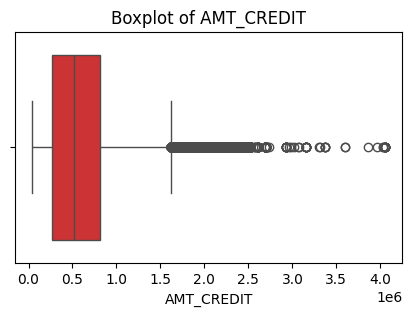

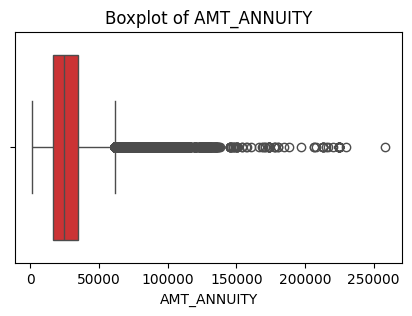

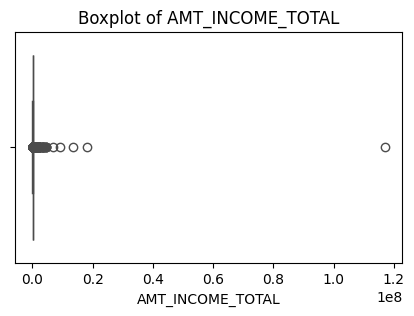

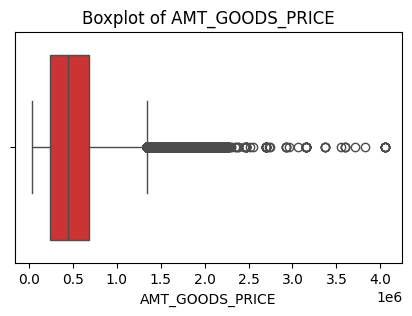

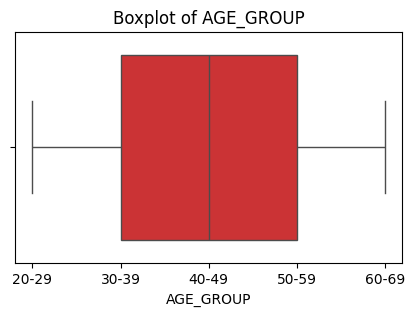

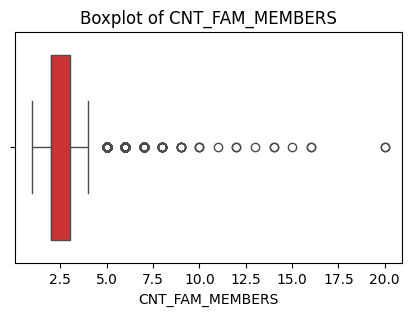

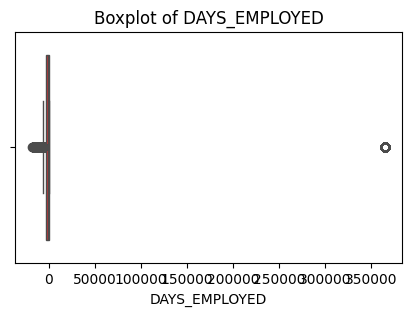

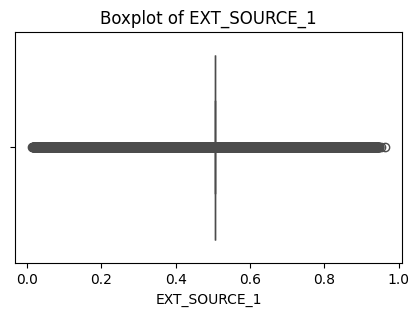

In [32]:
# To check for outliers using Boxplots
columns = [
    'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_INCOME_TOTAL', 'AMT_GOODS_PRICE', 
    'AGE_GROUP', 'CNT_FAM_MEMBERS', 'DAYS_EMPLOYED','EXT_SOURCE_1'
]

# Plot box plots for each relevant column
sns.set_palette("Set1")
for col in columns:
    plt.figure(figsize=(5,3))
    sns.boxplot(x=app_data_cleaned[col], color=sns.color_palette("Set1")[0])
    plt.title(f"Boxplot of {col}")
    plt.show()

### Checking Outliers using Interquartile method (IQR)

In [33]:
# Outlier detection through Interquartile method (IQR)
columns = ['AMT_CREDIT', 'AMT_ANNUITY', 'AMT_INCOME_TOTAL', 'AMT_GOODS_PRICE', 
    'AGE_YEARS', 'CNT_FAM_MEMBERS', 'DAYS_EMPLOYED','EXT_SOURCE_1'
]

for col in columns:
    Q1 = app_data_cleaned[col].quantile(0.25)
    Q3 = app_data_cleaned[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    
    # Print the number of outliers detected
    num_outliers = ((app_data_cleaned[col] > upper_bound) | (app_data_cleaned[col] < lower_bound)).sum()
    print(f"Number of outliers in '{col}': {num_outliers}")

Number of outliers in 'AMT_CREDIT': 6562
Number of outliers in 'AMT_ANNUITY': 7504
Number of outliers in 'AMT_INCOME_TOTAL': 14035
Number of outliers in 'AMT_GOODS_PRICE': 14728
Number of outliers in 'AGE_YEARS': 0
Number of outliers in 'CNT_FAM_MEMBERS': 4007
Number of outliers in 'DAYS_EMPLOYED': 72216
Number of outliers in 'EXT_SOURCE_1': 134129


In [34]:
# Dividing the app_data into 2 parts based on the TARGET variable for comparative analysis
Defaulters=app_data_cleaned[app_data_cleaned['TARGET']==1]
Non_Defaulters=app_data_cleaned[app_data_cleaned['TARGET']==0]

In [35]:
Defaulters.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,COMMONAREA_AVG,NONLIVINGAREA_AVG,FONDKAPREMONT_MODE,HOUSETYPE_MODE,AGE_YEARS,AGE_GROUP
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0.262949,0.139376,0.0247,0.0369,0.0143,0.0000,reg oper account,block of flats,25,20-29
26,100031,1,Cash loans,F,N,Y,0,112500.0,979992.0,27076.5,...,0.548477,0.190706,0.0165,0.0089,0.0211,0.0000,reg oper account,block of flats,51,50-59
40,100047,1,Cash loans,M,N,Y,0,202500.0,1193580.0,35028.0,...,0.306841,0.320163,0.1309,0.1250,0.0822,0.0078,org spec account,block of flats,47,40-49
42,100049,1,Cash loans,F,N,N,0,135000.0,288873.0,16258.5,...,0.674203,0.399676,0.0876,0.0763,0.0211,0.0036,reg oper account,block of flats,36,30-39
81,100096,1,Cash loans,F,N,Y,0,81000.0,252000.0,14593.5,...,0.023952,0.720944,0.0876,0.0763,0.0211,0.0036,reg oper account,block of flats,67,60-69


In [36]:
Non_Defaulters.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,COMMONAREA_AVG,NONLIVINGAREA_AVG,FONDKAPREMONT_MODE,HOUSETYPE_MODE,AGE_YEARS,AGE_GROUP
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0.622246,0.535276,0.0959,0.0529,0.0605,0.0098,reg oper account,block of flats,45,40-49
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0.555912,0.729567,0.0876,0.0763,0.0211,0.0036,reg oper account,block of flats,52,50-59
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0.650442,0.535276,0.0876,0.0763,0.0211,0.0036,reg oper account,block of flats,52,50-59
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0.322738,0.535276,0.0876,0.0763,0.0211,0.0036,reg oper account,block of flats,54,50-59
5,100008,0,Cash loans,M,N,Y,0,99000.0,490495.5,27517.5,...,0.354225,0.621226,0.0876,0.0763,0.0211,0.0036,reg oper account,block of flats,46,40-49


In [37]:
# To find Summary statistics for applicants who had difficulties (TARGET = 1)
summary_Defaulters= Defaulters.describe()
summary_Defaulters

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,COMMONAREA_AVG,NONLIVINGAREA_AVG,AGE_YEARS
count,24825.000000,24825.0,24825.000000,2.482500e+04,2.482500e+04,24825.000000,2.482500e+04,24825.000000,24825.000000,24825.000000,...,24825.00000,24825.000000,24825.000000,24825.000000,24825.000000,24825.000000,24825.000000,24825.000000,24825.000000,24825.000000
mean,277449.167936,1.0,0.463807,1.656118e+05,5.577785e+05,26481.744290,4.889394e+05,0.019131,-14884.828077,42394.675448,...,0.30292,0.221672,0.457791,0.411260,0.423775,0.095313,0.078158,0.025831,0.011742,40.279960
std,102383.123458,0.0,0.756903,7.466770e+05,3.464332e+05,12450.676999,3.115067e+05,0.011905,4192.844583,119484.634253,...,0.45953,0.415380,0.142787,0.213002,0.190676,0.066392,0.044267,0.034816,0.039936,11.484458
min,100002.000000,1.0,0.000000,2.565000e+04,4.500000e+04,2722.500000,4.500000e+04,0.000533,-25168.000000,-16069.000000,...,0.00000,0.000000,0.014691,0.000005,0.000527,0.000000,0.000000,0.000000,0.000000,21.000000
25%,189555.000000,1.0,0.000000,1.125000e+05,2.844000e+05,17361.000000,2.385000e+05,0.009630,-18037.000000,-2156.000000,...,0.00000,0.000000,0.434735,0.239084,0.269286,0.087600,0.076300,0.021100,0.003600,31.000000
50%,276291.000000,1.0,0.000000,1.350000e+05,4.975200e+05,25263.000000,4.500000e+05,0.018634,-14282.000000,-1034.000000,...,0.00000,0.000000,0.505998,0.441076,0.475850,0.087600,0.076300,0.021100,0.003600,39.000000
75%,366050.000000,1.0,1.000000,2.025000e+05,7.333155e+05,32976.000000,6.750000e+05,0.025164,-11396.000000,-379.000000,...,1.00000,0.000000,0.505998,0.593937,0.535276,0.087600,0.076300,0.021100,0.003600,49.000000
max,456254.000000,1.0,11.000000,1.170000e+08,4.027680e+06,149211.000000,3.600000e+06,0.072508,-7678.000000,365243.000000,...,1.00000,1.000000,0.929394,0.811870,0.896010,1.000000,1.000000,1.000000,1.000000,68.000000


In [38]:
# To find Summary statistics for applicants who had no difficulties (TARGET = 0)
summary_Non_Defaulters = Non_Defaulters.describe()
summary_Non_Defaulters

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,COMMONAREA_AVG,NONLIVINGAREA_AVG,AGE_YEARS
count,282682.000000,282682.0,282682.000000,2.826820e+05,2.826820e+05,282682.000000,2.826820e+05,282682.000000,282682.000000,282682.000000,...,282682.000000,282682.000000,282682.000000,2.826820e+05,282682.000000,282682.000000,282682.000000,282682.000000,282682.000000,282682.000000
mean,278245.842707,0.0,0.412941,1.690775e+05,6.026512e+05,27163.629193,5.426542e+05,0.021021,-16138.212861,65697.133617,...,0.224093,0.175858,0.508396,5.235692e-01,0.523770,0.102911,0.081616,0.028393,0.014956,43.713222
std,102825.730701,0.0,0.718840,1.104769e+05,4.068479e+05,14658.071061,3.736269e+05,0.013978,4364.193277,142878.579266,...,0.416984,0.380700,0.138363,1.860868e-01,0.170919,0.078277,0.054155,0.043755,0.048792,11.955270
min,100003.000000,0.0,0.000000,2.565000e+04,4.500000e+04,1615.500000,4.050000e+04,0.000290,-25229.000000,-17912.000000,...,0.000000,0.000000,0.014568,8.173617e-08,0.000527,0.000000,0.000000,0.000000,0.000000,20.000000
25%,189104.250000,0.0,0.000000,1.125000e+05,2.700000e+05,16456.500000,2.385000e+05,0.010006,-19793.750000,-2813.000000,...,0.000000,0.000000,0.505998,4.103394e-01,0.431192,0.087600,0.076300,0.021100,0.003600,34.000000
50%,278363.500000,0.0,0.000000,1.485000e+05,5.177880e+05,24876.000000,4.500000e+05,0.018850,-15877.000000,-1235.000000,...,0.000000,0.000000,0.505998,5.733993e-01,0.535276,0.087600,0.076300,0.021100,0.003600,43.000000
75%,367242.750000,0.0,1.000000,2.025000e+05,8.100000e+05,34749.000000,6.850024e+05,0.028663,-12536.000000,-278.000000,...,0.000000,0.000000,0.505998,6.675207e-01,0.643026,0.087600,0.076300,0.021100,0.003600,54.000000
max,456255.000000,0.0,19.000000,1.800009e+07,4.050000e+06,258025.500000,4.050000e+06,0.072508,-7489.000000,365243.000000,...,1.000000,1.000000,0.962693,8.549997e-01,0.893976,1.000000,1.000000,1.000000,1.000000,69.000000


## Exploratory Data Analysis (application_data.csv)

### Target Variable Distribution


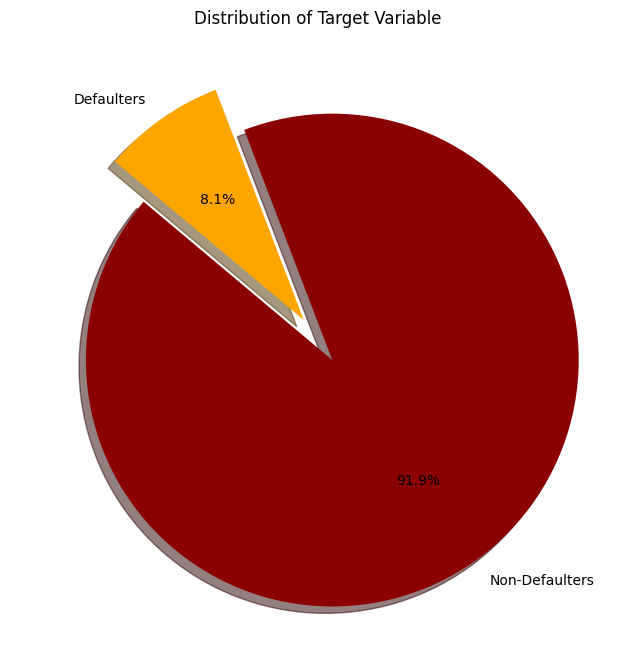

In [39]:
# Distribution of 'TARGET' variable
# Count the occurrences of each class in 'TARGET'
target_counts = app_data_cleaned['TARGET'].value_counts()

# Define colors for the pie chart
colors = ['darkred', 'Orange']  # darkred for Non-Defaulters, Orange for Defaulters

# Define the explode parameter to separate the slices
explode = [0.1, 0.1]  # Slightly separate both slices

# Create the pie chart
plt.figure(figsize=(8, 8))
plt.pie(target_counts, labels=['Non-Defaulters', 'Defaulters'], colors=colors, autopct='%1.1f%%', startangle=140, explode=explode, shadow=True)
plt.title('Distribution of Target Variable')
plt.show()

### Univariate Analysis of Numerical Features

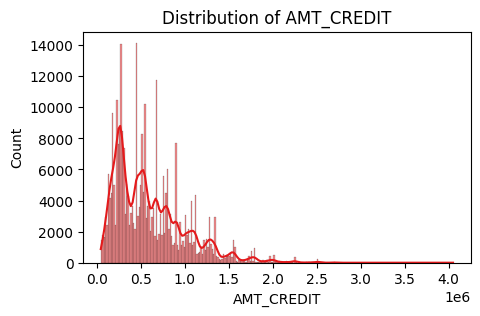

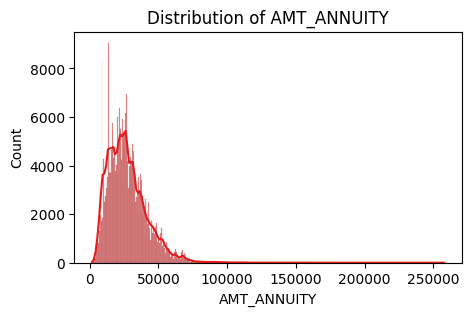

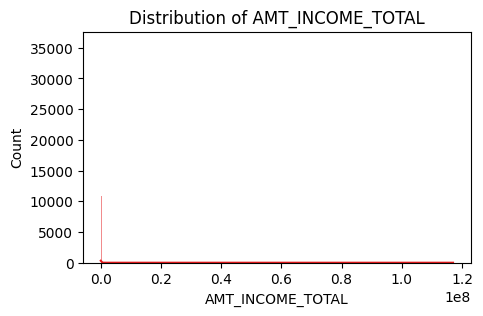

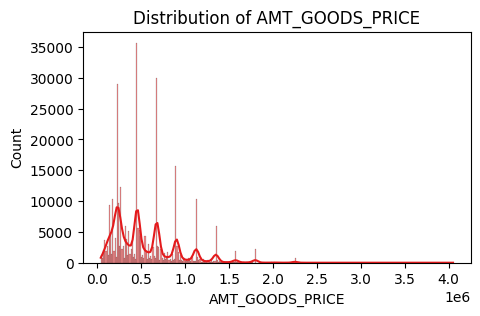

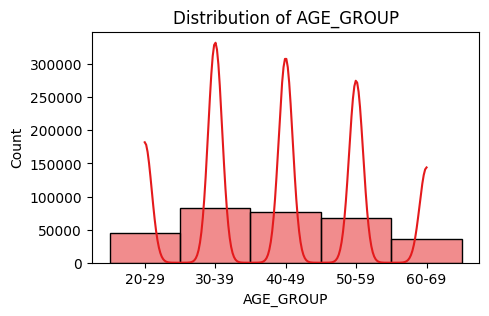

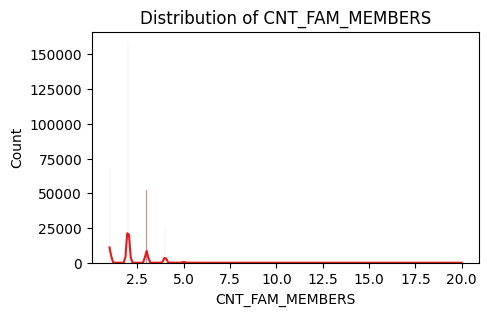

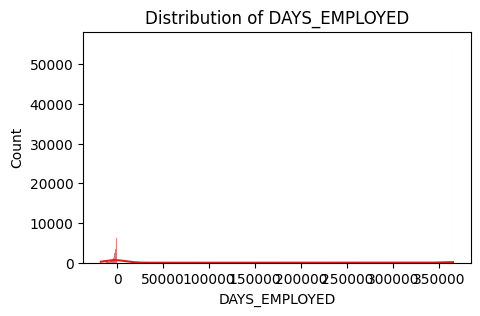

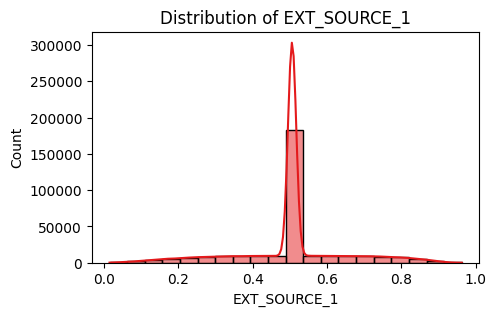

In [40]:
# To find distribution of Numerical Variables
# List of numerical features
numerical_features = ['AMT_CREDIT', 'AMT_ANNUITY', 'AMT_INCOME_TOTAL', 'AMT_GOODS_PRICE', 'AGE_GROUP', 'CNT_FAM_MEMBERS', 'DAYS_EMPLOYED','EXT_SOURCE_1']

for feature in numerical_features:
    plt.figure(figsize=(5, 3))
    sns.histplot(app_data_cleaned[feature], kde=True)
    plt.title(f'Distribution of {feature}')
    plt.show()

### Univariate Analysis of Categorical Features

C:\Users\sweth\AppData\Local\Temp\ipykernel_42308\182313335.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=feature, data=app_data_cleaned, order=sorted_counts.index, palette=[colors[i % len(colors)]])
C:\Users\sweth\AppData\Local\Temp\ipykernel_42308\182313335.py:15: UserWarning: 
The palette list has fewer values (1) than needed (2) and will cycle, which may produce an uninterpretable plot.
  sns.countplot(y=feature, data=app_data_cleaned, order=sorted_counts.index, palette=[colors[i % len(colors)]])


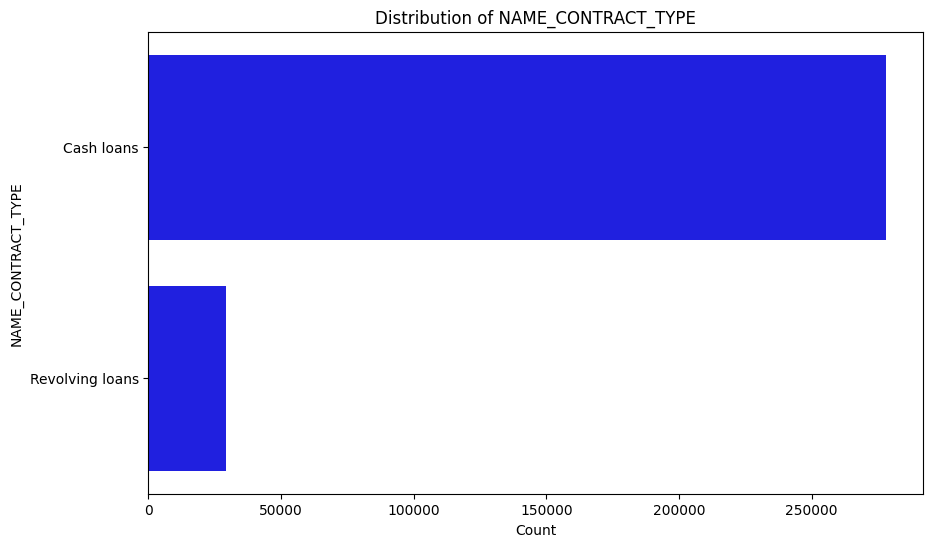

C:\Users\sweth\AppData\Local\Temp\ipykernel_42308\182313335.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=feature, data=app_data_cleaned, order=sorted_counts.index, palette=[colors[i % len(colors)]])
C:\Users\sweth\AppData\Local\Temp\ipykernel_42308\182313335.py:15: UserWarning: 
The palette list has fewer values (1) than needed (2) and will cycle, which may produce an uninterpretable plot.
  sns.countplot(y=feature, data=app_data_cleaned, order=sorted_counts.index, palette=[colors[i % len(colors)]])


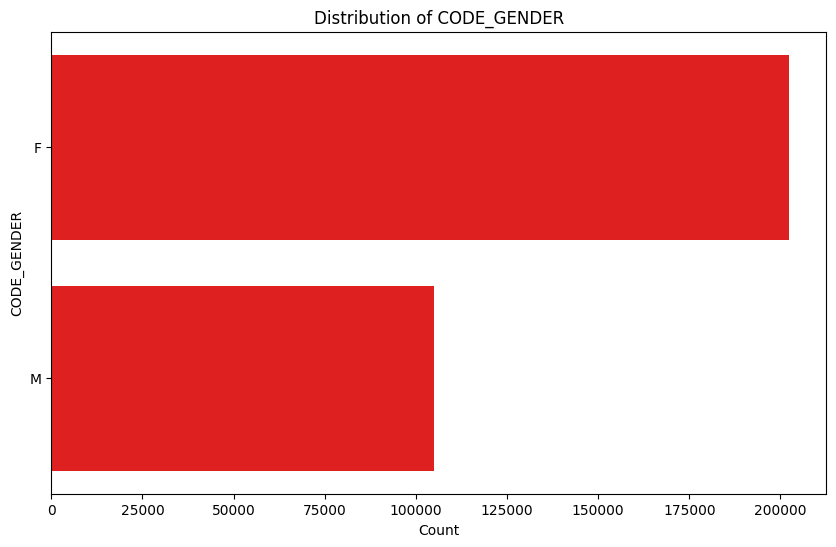

C:\Users\sweth\AppData\Local\Temp\ipykernel_42308\182313335.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=feature, data=app_data_cleaned, order=sorted_counts.index, palette=[colors[i % len(colors)]])
C:\Users\sweth\AppData\Local\Temp\ipykernel_42308\182313335.py:15: UserWarning: 
The palette list has fewer values (1) than needed (8) and will cycle, which may produce an uninterpretable plot.
  sns.countplot(y=feature, data=app_data_cleaned, order=sorted_counts.index, palette=[colors[i % len(colors)]])


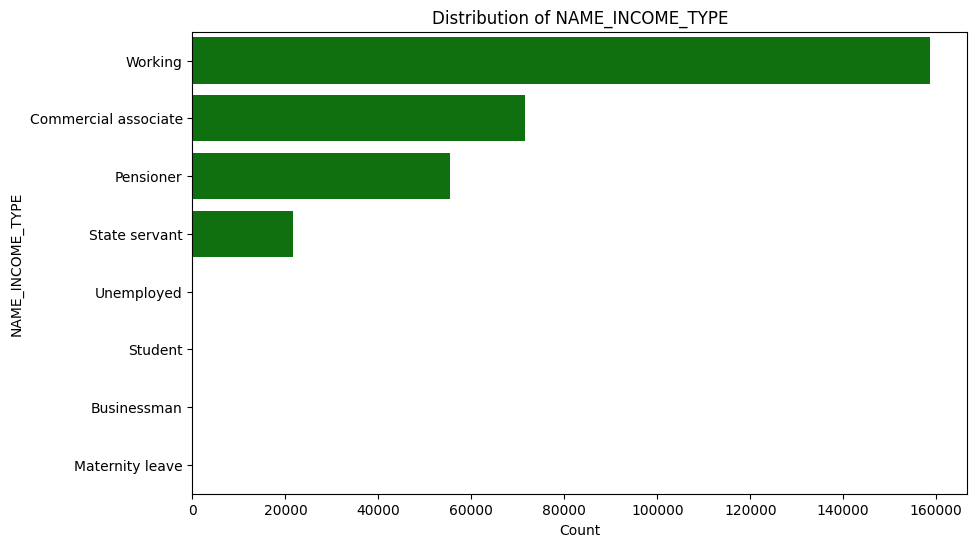

C:\Users\sweth\AppData\Local\Temp\ipykernel_42308\182313335.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=feature, data=app_data_cleaned, order=sorted_counts.index, palette=[colors[i % len(colors)]])
C:\Users\sweth\AppData\Local\Temp\ipykernel_42308\182313335.py:15: UserWarning: 
The palette list has fewer values (1) than needed (5) and will cycle, which may produce an uninterpretable plot.
  sns.countplot(y=feature, data=app_data_cleaned, order=sorted_counts.index, palette=[colors[i % len(colors)]])


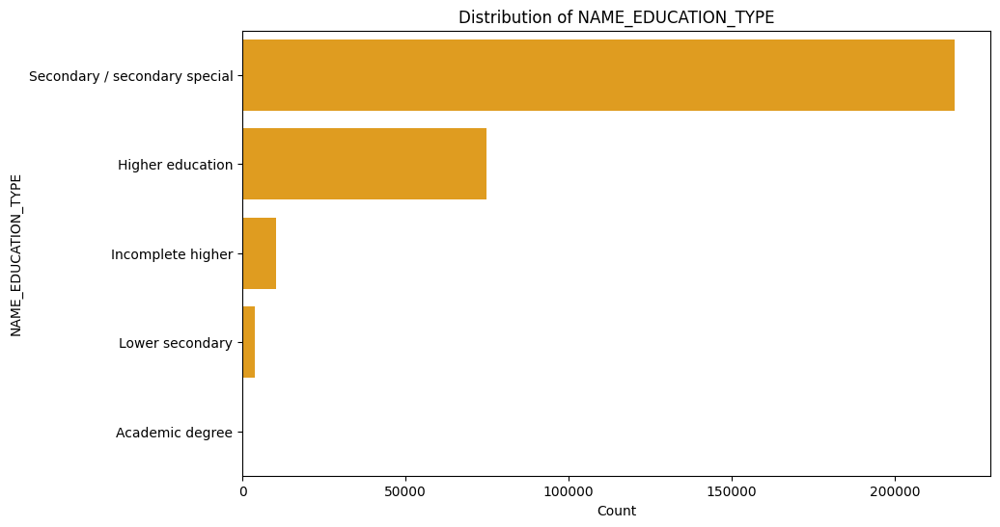

C:\Users\sweth\AppData\Local\Temp\ipykernel_42308\182313335.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=feature, data=app_data_cleaned, order=sorted_counts.index, palette=[colors[i % len(colors)]])
C:\Users\sweth\AppData\Local\Temp\ipykernel_42308\182313335.py:15: UserWarning: 
The palette list has fewer values (1) than needed (6) and will cycle, which may produce an uninterpretable plot.
  sns.countplot(y=feature, data=app_data_cleaned, order=sorted_counts.index, palette=[colors[i % len(colors)]])


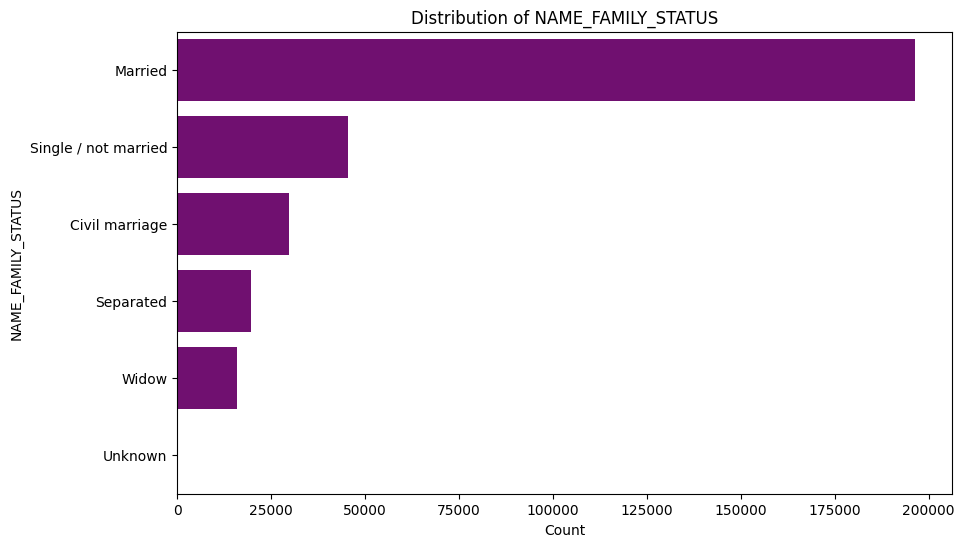

C:\Users\sweth\AppData\Local\Temp\ipykernel_42308\182313335.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=feature, data=app_data_cleaned, order=sorted_counts.index, palette=[colors[i % len(colors)]])
C:\Users\sweth\AppData\Local\Temp\ipykernel_42308\182313335.py:15: UserWarning: 
The palette list has fewer values (1) than needed (6) and will cycle, which may produce an uninterpretable plot.
  sns.countplot(y=feature, data=app_data_cleaned, order=sorted_counts.index, palette=[colors[i % len(colors)]])


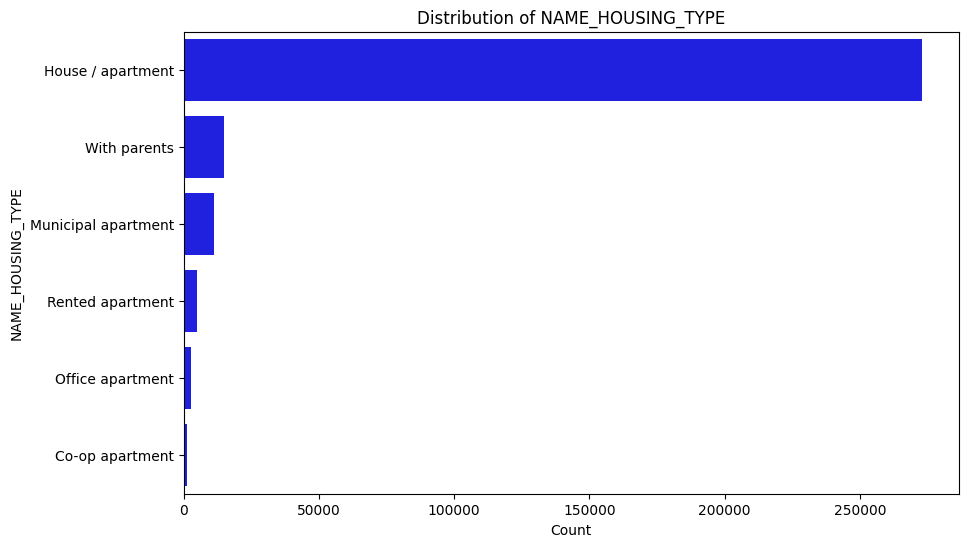

C:\Users\sweth\AppData\Local\Temp\ipykernel_42308\182313335.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=feature, data=app_data_cleaned, order=sorted_counts.index, palette=[colors[i % len(colors)]])
C:\Users\sweth\AppData\Local\Temp\ipykernel_42308\182313335.py:15: UserWarning: 
The palette list has fewer values (1) than needed (18) and will cycle, which may produce an uninterpretable plot.
  sns.countplot(y=feature, data=app_data_cleaned, order=sorted_counts.index, palette=[colors[i % len(colors)]])


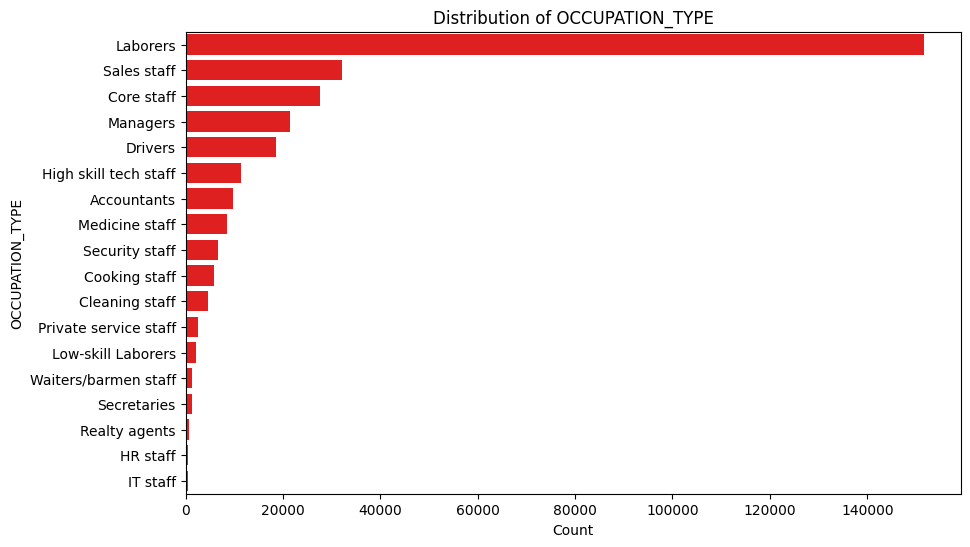

In [41]:
import seaborn as sns
import matplotlib.pyplot as plt

# Define the colors for the plot
colors = ['Blue', 'Red', 'Green', 'Orange', 'Purple']  # Example colors: Blue, Red, Green

# List of categorical features to analyze
categorical_features = ['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE']

# Plot horizontal bar plots for each categorical feature with colors
for i, feature in enumerate(categorical_features):
    plt.figure(figsize=(10, 6))
    # Get the counts and sort them in descending order
    sorted_counts = app_data_cleaned[feature].value_counts().sort_values(ascending=False)
    sns.countplot(y=feature, data=app_data_cleaned, order=sorted_counts.index, palette=[colors[i % len(colors)]])
    plt.title(f'Distribution of {feature}')
    plt.xlabel('Count')
    plt.ylabel(feature)
    plt.show()



## Bivariate Analysis

#### In this analysis we focus on the relationship between each feature and the TARGET variable.

### Bivariate Analysis of Numerical Features with the Target

C:\Users\sweth\AppData\Local\Temp\ipykernel_42308\3147584966.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='TARGET', y=feature, data=app_data_cleaned, palette=colors, split=True)


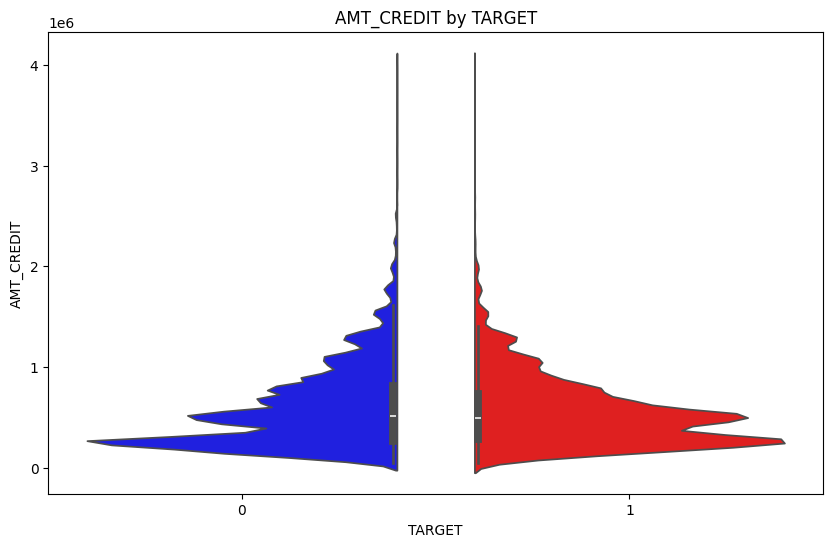

C:\Users\sweth\AppData\Local\Temp\ipykernel_42308\3147584966.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='TARGET', y=feature, data=app_data_cleaned, palette=colors, split=True)


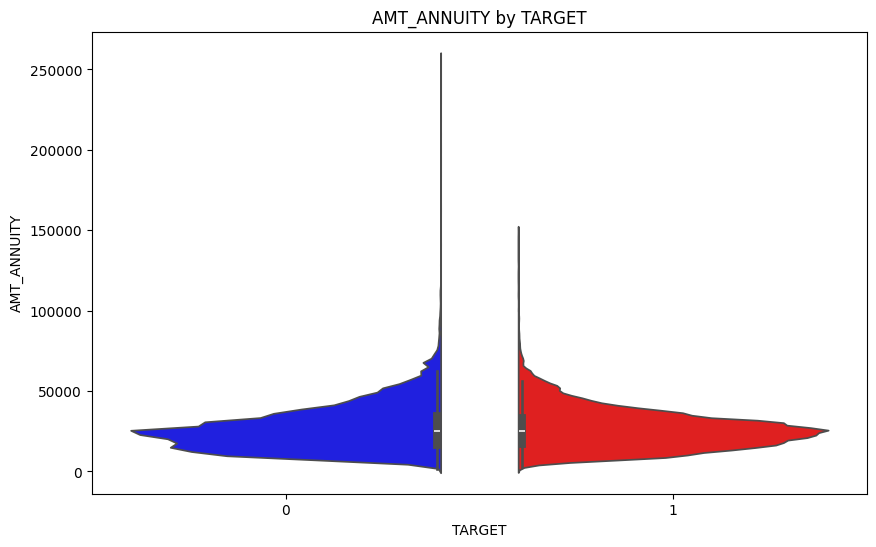

C:\Users\sweth\AppData\Local\Temp\ipykernel_42308\3147584966.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='TARGET', y=feature, data=app_data_cleaned, palette=colors, split=True)


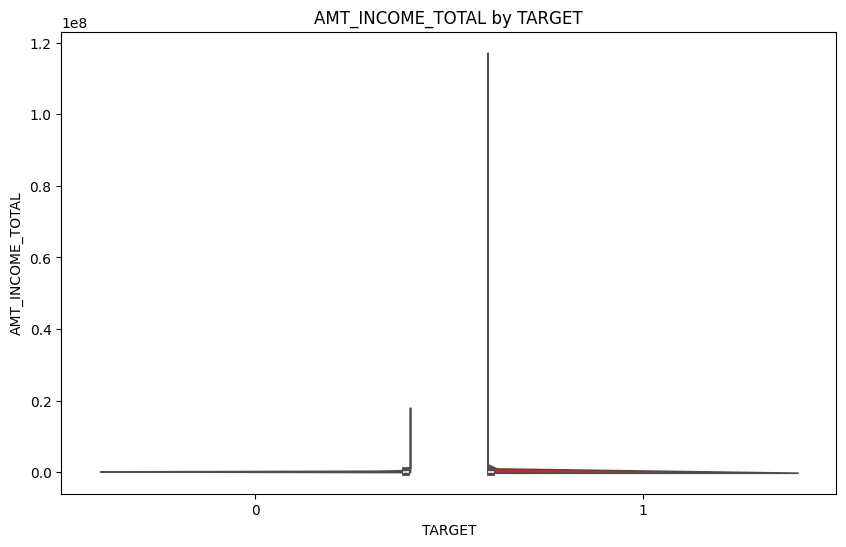

C:\Users\sweth\AppData\Local\Temp\ipykernel_42308\3147584966.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='TARGET', y=feature, data=app_data_cleaned, palette=colors, split=True)


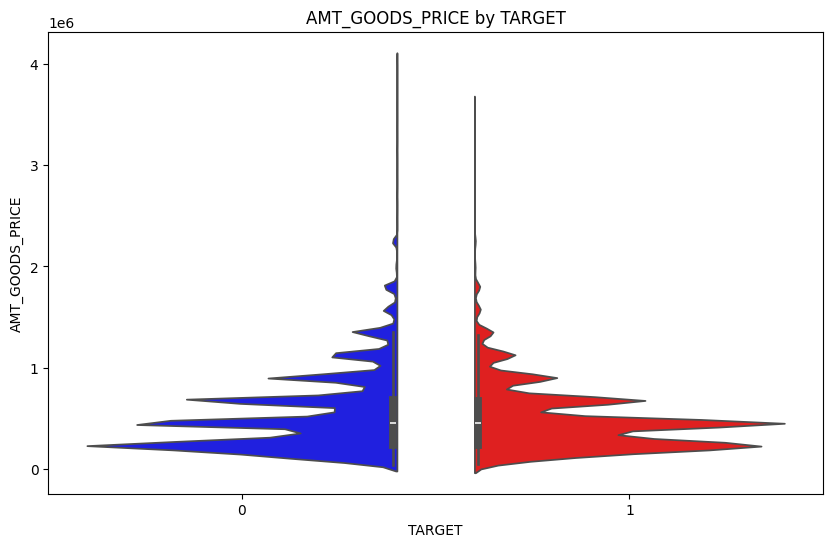

C:\Users\sweth\AppData\Local\Temp\ipykernel_42308\3147584966.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='TARGET', y=feature, data=app_data_cleaned, palette=colors, split=True)
C:\Users\sweth\AppData\Local\Temp\ipykernel_42308\3147584966.py:7: UserWarning: 
The palette list has fewer values (2) than needed (6) and will cycle, which may produce an uninterpretable plot.
  sns.violinplot(x='TARGET', y=feature, data=app_data_cleaned, palette=colors, split=True)


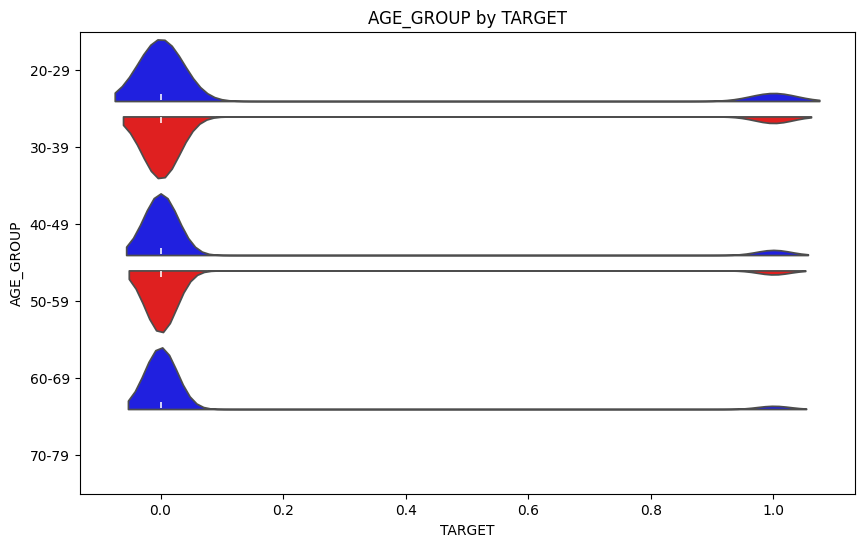

C:\Users\sweth\AppData\Local\Temp\ipykernel_42308\3147584966.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='TARGET', y=feature, data=app_data_cleaned, palette=colors, split=True)


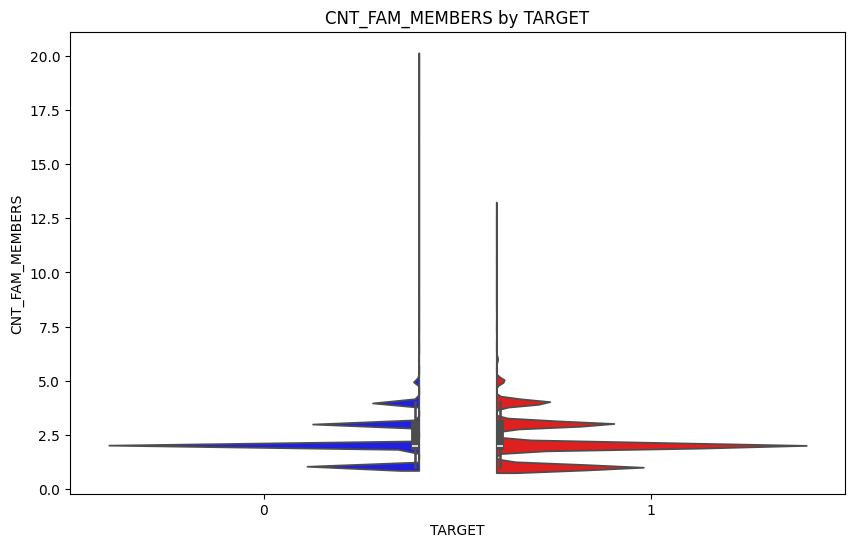

C:\Users\sweth\AppData\Local\Temp\ipykernel_42308\3147584966.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='TARGET', y=feature, data=app_data_cleaned, palette=colors, split=True)


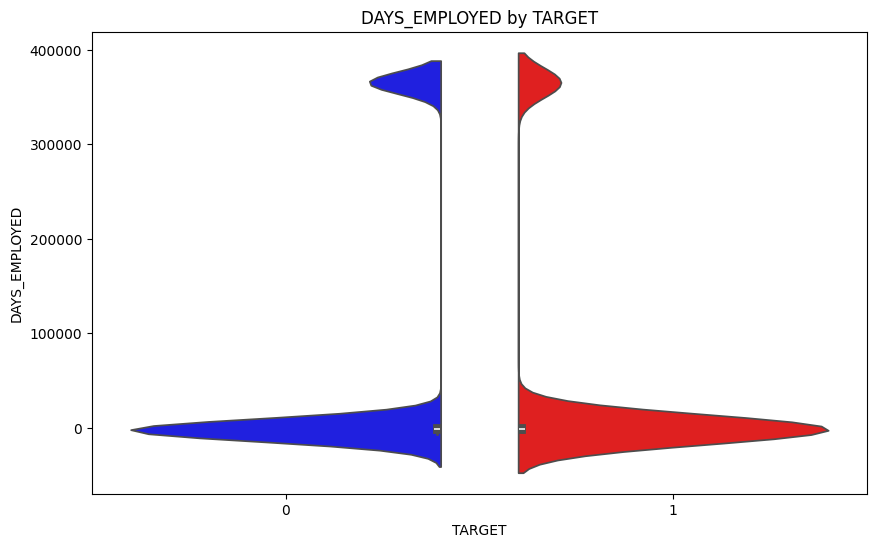

C:\Users\sweth\AppData\Local\Temp\ipykernel_42308\3147584966.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='TARGET', y=feature, data=app_data_cleaned, palette=colors, split=True)


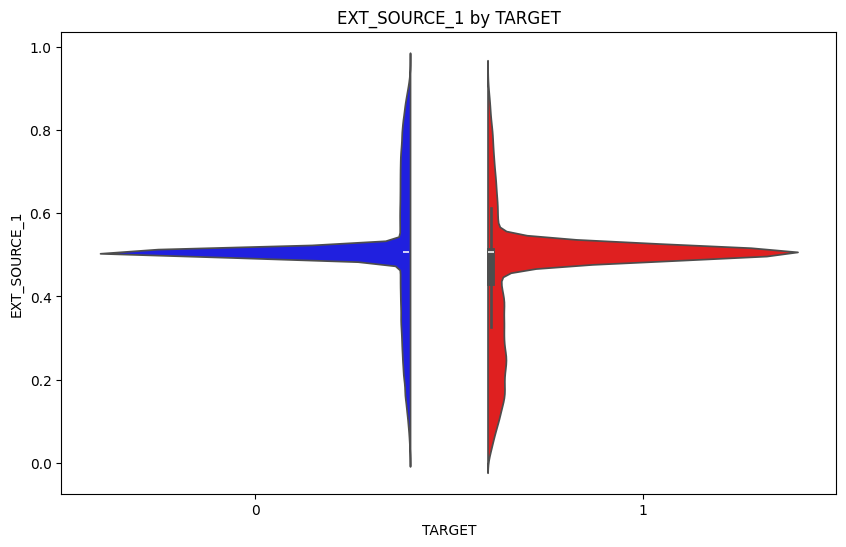

In [42]:
#Define a color palette for the violin plots
colors = ['Blue', 'Red']   # Blue and Red

# Plot violin plots for each numerical feature by TARGET with colors
for feature in numerical_features:
    plt.figure(figsize=(10, 6))
    sns.violinplot(x='TARGET', y=feature, data=app_data_cleaned, palette=colors, split=True)
    plt.title(f'{feature} by TARGET')
    plt.xlabel('TARGET')
    plt.ylabel(feature)
    plt.show()

### Bivariate Analysis of Categorical Features with the Target

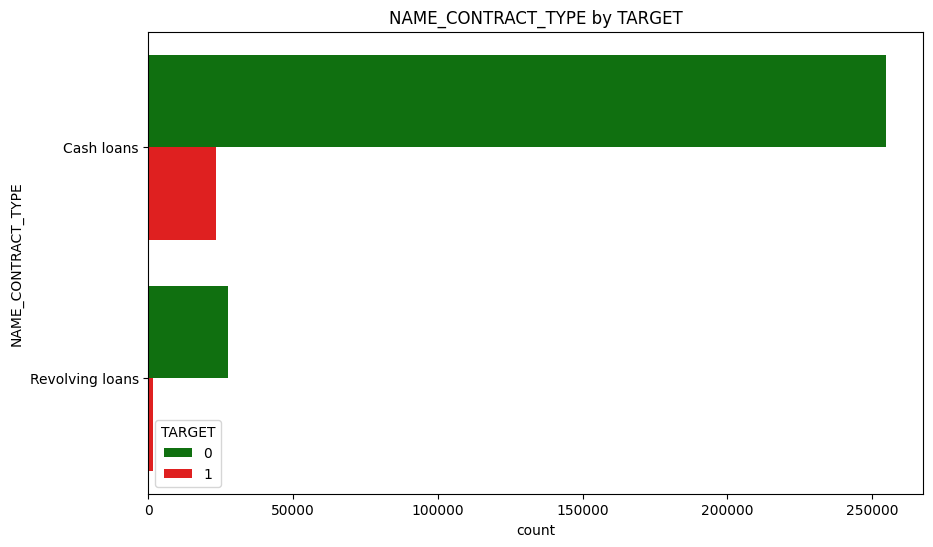

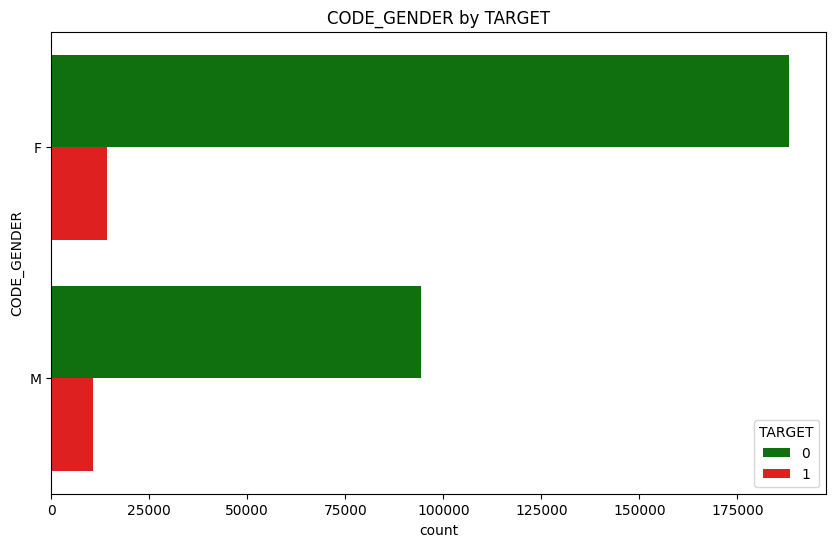

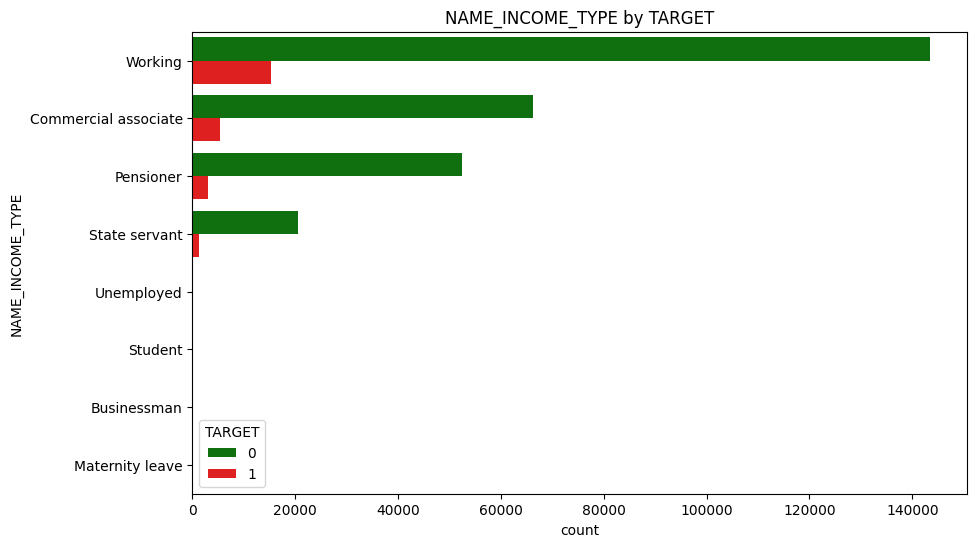

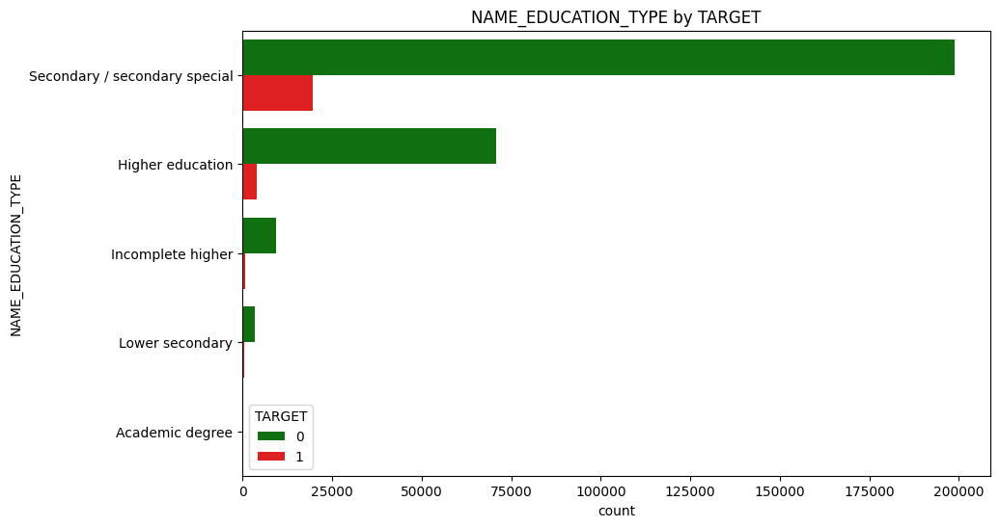

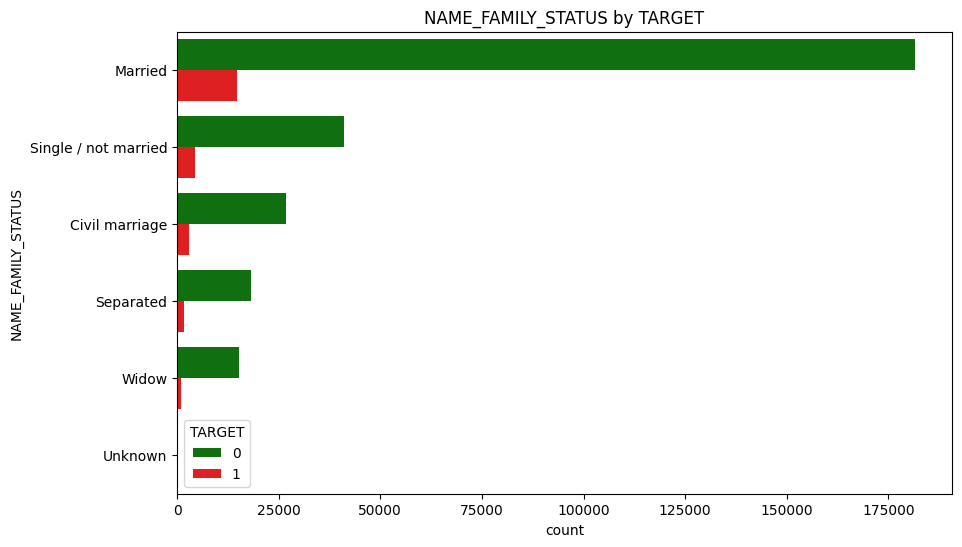

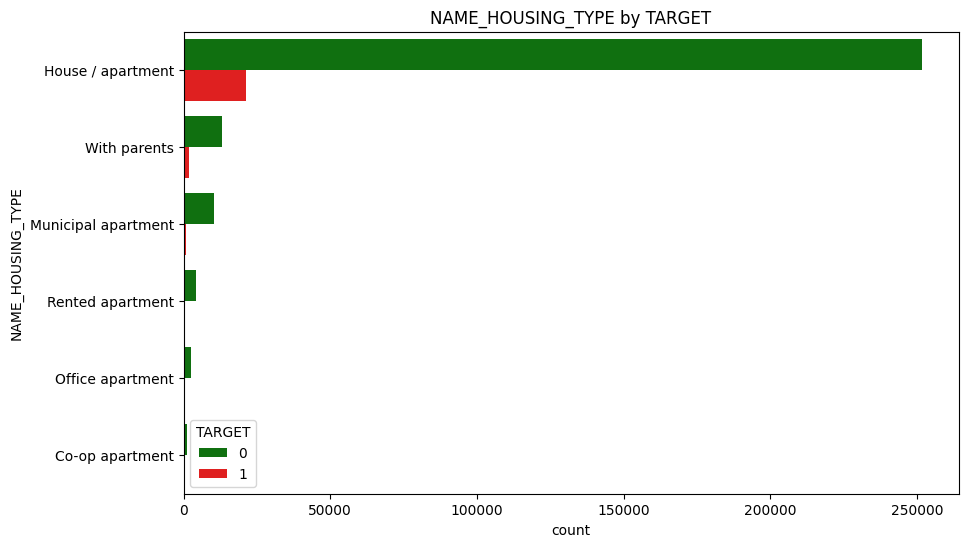

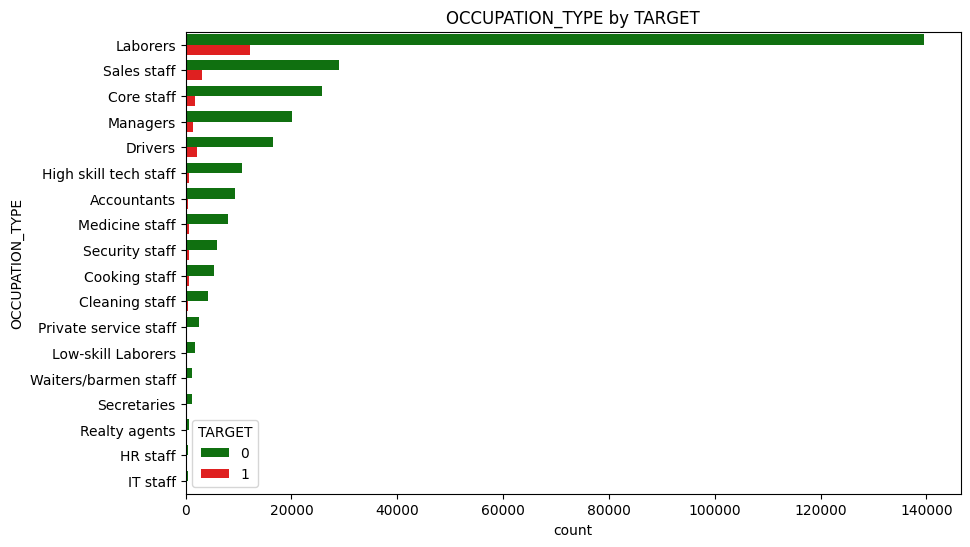

In [43]:
# Plot bar plots for each categorical feature by TARGET
colors = ['Green', 'Red']

# Plot horizontal bar plots for each categorical feature by TARGET with custom colors and in descending order
for feature in categorical_features:
    plt.figure(figsize=(10, 6))
    
    # Count the occurrences and sort in descending order
    order = app_data_cleaned[feature].value_counts().index
    
    sns.countplot(y=feature, hue='TARGET', data=app_data_cleaned, palette=colors, order=order)
    plt.title(f'{feature} by TARGET')
    plt.show()


### Correlation Analysis

##### To check the correlation between numerical features and the target variable to see which features are more related to loan default.

In [44]:
# Select only numeric columns
numeric_columns = app_data_cleaned.select_dtypes(include=['float64', 'int64']).columns

# Calculate the correlation matrix using only numeric columns
correlation_matrix = app_data_cleaned[numeric_columns].corr()

# Extract the correlation with the 'TARGET' variable and sort it
correlation_with_target = correlation_matrix['TARGET'].sort_values(ascending=False)

# Display the correlation with the target variable
print(correlation_with_target)

TARGET                         1.000000
DAYS_BIRTH                     0.078242
REGION_RATING_CLIENT_W_CITY    0.060895
REGION_RATING_CLIENT           0.058901
DAYS_ID_PUBLISH                0.051457
REG_CITY_NOT_WORK_CITY         0.050992
REG_CITY_NOT_LIVE_CITY         0.044394
DAYS_REGISTRATION              0.041976
LIVE_CITY_NOT_WORK_CITY        0.032517
CNT_CHILDREN                   0.019189
CNT_FAM_MEMBERS                0.009311
REG_REGION_NOT_WORK_REGION     0.006941
REG_REGION_NOT_LIVE_REGION     0.005575
LIVE_REGION_NOT_WORK_REGION    0.002819
SK_ID_CURR                    -0.002111
AMT_INCOME_TOTAL              -0.003982
AMT_ANNUITY                   -0.012817
COMMONAREA_AVG                -0.016195
BASEMENTAREA_AVG              -0.017634
NONLIVINGAREA_AVG             -0.018188
HOUR_APPR_PROCESS_START       -0.024164
APARTMENTS_AVG                -0.026736
AMT_CREDIT                    -0.030371
REGION_POPULATION_RELATIVE    -0.037225
AMT_GOODS_PRICE               -0.039625


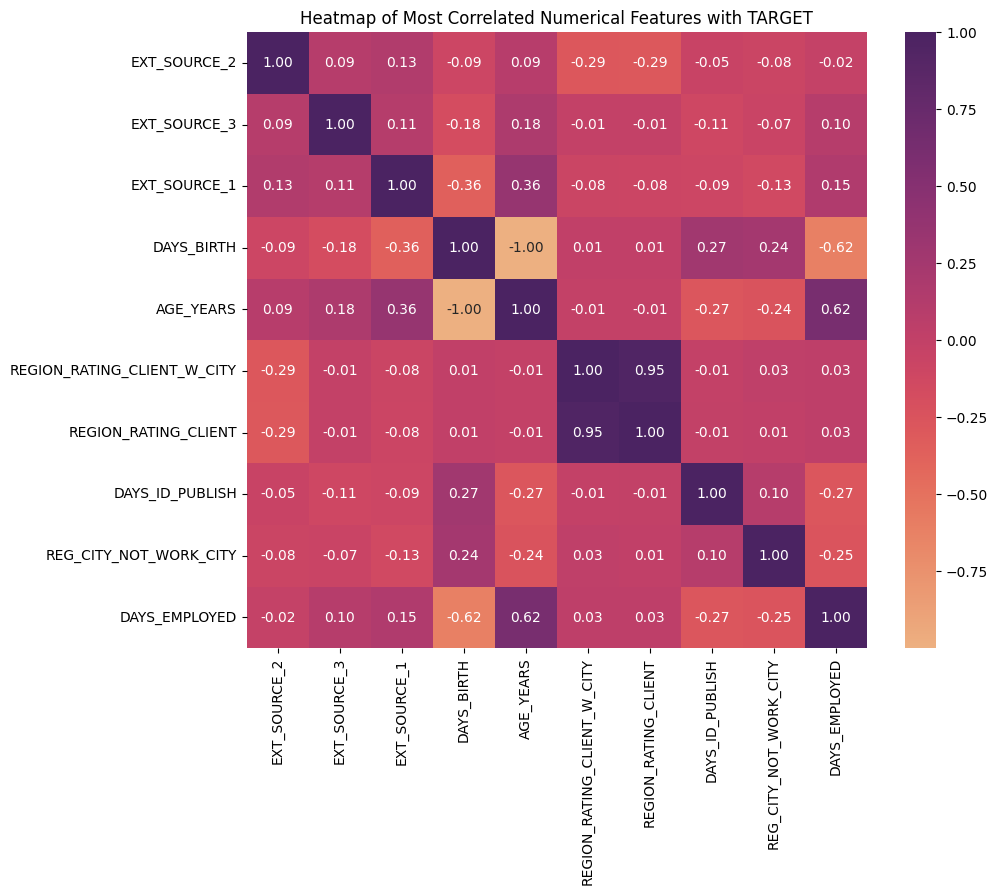

In [45]:
# Select only numeric columns
numeric_cols = app_data_cleaned.select_dtypes(include=['number'])

# Calculate the correlation matrix for numeric columns only
correlation_matrix = numeric_cols.corr()

# Get the absolute correlations with the TARGET variable
correlation_with_target = correlation_matrix['TARGET'].abs()

# Sort the correlations and select the top 10 (excluding the TARGET itself)
top_10_features = correlation_with_target.sort_values(ascending=False).index[1:11]

# Create a heatmap of the correlations among the top 10 most correlated variables
plt.figure(figsize=(10, 8))
sns.heatmap(numeric_cols[top_10_features].corr(), annot=True, fmt=".2f", cmap="flare")
plt.title('Heatmap of Most Correlated Numerical Features with TARGET')
plt.show()

### Mutivariate Analysis -  Pair Plot

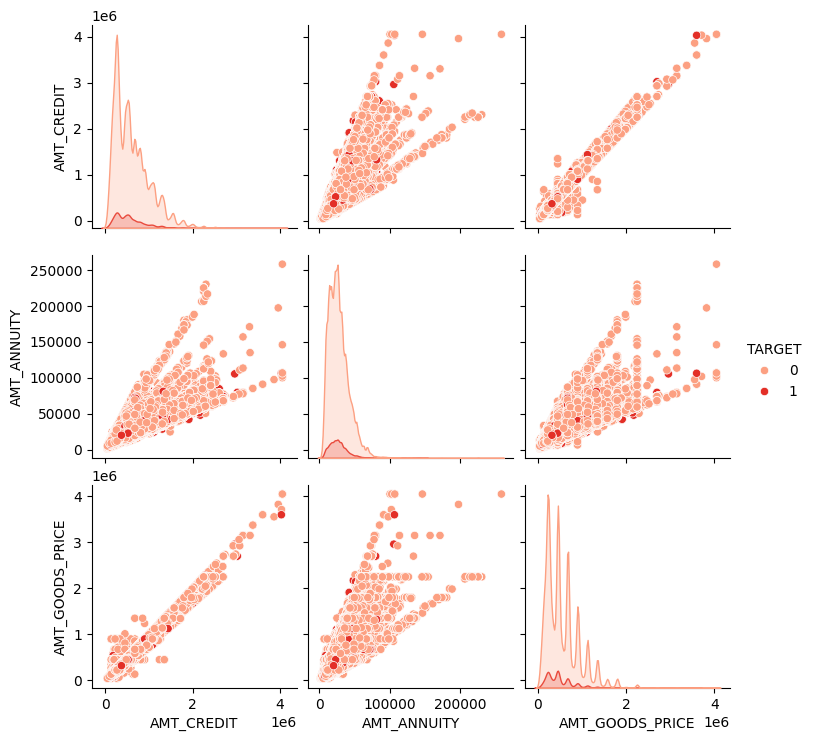

In [46]:
# To check strong correlations
selected_features = ['AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'TARGET']

# Create pair plots
sns.pairplot(app_data_cleaned[selected_features], hue='TARGET', palette='Reds')
plt.show()

In [47]:
# Since i am doing analsyis in two seperate Notebooks, %store magic command stores the DataFrame in the notebook's environment which allows to reload it
%store app_data_cleaned

Stored 'app_data_cleaned' (DataFrame)


C:\Users\sweth\AppData\Roaming\Python\Python312\site-packages\IPython\extensions\storemagic.py:229: UserWarning: This is now an optional IPython functionality, setting autorestore/app_data_cleaned requires you to install the `pickleshare` library.
  db[ 'autorestore/' + arg ] = obj


In [48]:
# To save the DataFrame to a file, allowing to load it in another Python session or script.
import pickle

# Save cleaned data
with open('app_data_cleaned.pkl', 'wb') as f:
    pickle.dump(app_data_cleaned, f)